In [1]:
# To access our dataset file
from google.colab import drive
drive.mount('/content/drive/')
dataset_path = '/content/drive/Shareddrives/AAX/Resources/dataset_Seminar5/'

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:
# Importing modules

import csv
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix
import plotly.graph_objects as go
import torch
import torch.nn as nn
from sklearn.preprocessing import PowerTransformer
from torch.utils.data import Dataset, DataLoader, random_split
import random
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Input # Import Input


## **Part I: ML model definition**

First, we load all the clients' datasets, scale the data, and organize them in two arrays, one for features and another for labels. We keep an array of the reshaped features of all clients for easy visualization.

In [3]:
num_clients = 10
num_classes = 12

In [4]:
# Holding client features datasets
client_dfs_features = []
# Holding reshaped client datasets for visualization
client_dfs_features_amp = []
# Holding client labels datasets
client_dfs_labels = []
scaler = PowerTransformer()
# Loading client datasets iteratively
for dataset in range(num_clients):
  dataset_features = f"client_{dataset+1}_features.csv"
  dataset_labels = f"client_{dataset+1}_labels.csv"
  client_df_features = pd.read_csv(dataset_path + 'client_datasets/' + dataset_features, sep=",", header=None).values.astype(float)
  # Reshape for visualization
  client_df_features_amp = client_df_features.reshape(-1,30,3,3)
  client_df_labels = pd.read_csv(dataset_path + 'client_datasets/' + dataset_labels, sep=",", header=None).values.astype(int)

  # Scaling features
  client_df_features_scaled = scaler.fit_transform(client_df_features)
  # Saving scaled, reshaped and labels datasets
  client_dfs_features.append(client_df_features_scaled)
  client_dfs_features_amp.append(client_df_features_amp)
  client_dfs_labels.append(client_df_labels)
  print(f"##### Client {dataset+1} #####")
  display(client_df_features_amp)
  # display(client_df_features)
  display(client_df_labels)
  print("\n")
  # print("####################")

##### Client 1 #####


array([[[[14.863  , 20.824  , 24.354  ],
         [27.318  , 28.911  , 25.755  ],
         [30.51   , 31.313  , 32.882  ]],

        [[30.211  , 31.477  , 31.477  ],
         [34.31   , 34.2    , 35.155  ],
         [32.006  , 32.358  , 30.351  ]],

        [[30.351  , 29.818  , 27.801  ],
         [25.59   , 25.644  , 24.877  ],
         [24.016  , 19.348  , 16.982  ]],

        ...,

        [[ 6.6242 ,  7.6621 ,  9.4644 ],
         [10.85   , 14.197  , 12.556  ],
         [11.76   , 13.797  , 15.491  ]],

        [[18.993  , 20.024  , 22.176  ],
         [23.137  , 24.429  , 24.13   ],
         [22.953  , 20.242  , 19.933  ]],

        [[18.776  , 15.753  , 14.617  ],
         [14.398  , 14.345  , 14.313  ],
         [13.797  , 14.679  , 10.114  ]]],


       [[[15.114  , 20.059  , 22.708  ],
         [24.154  , 24.862  , 25.189  ],
         [25.306  , 24.428  , 23.636  ]],

        [[20.524  , 19.943  , 16.984  ],
         [15.468  , 13.375  , 13.271  ],
         [11.696  , 12.44  

array([[11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
        11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
        11, 11, 11, 11, 11,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
         7,  7,  7,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
         5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
         5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
         5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
         5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
         5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
         5,  5,  5,  5,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  1,  1,  1,  1,  1,  1,
         1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, 



##### Client 2 #####


array([[[[17.059  , 22.608  , 26.639  ],
         [31.694  , 34.995  , 33.691  ],
         [35.944  , 34.893  , 34.944  ]],

        [[31.366  , 34.136  , 32.235  ],
         [32.074  , 29.9    , 28.597  ],
         [27.079  , 24.43   , 20.974  ]],

        [[18.513  , 19.905  , 19.424  ],
         [17.529  , 23.144  , 25.547  ],
         [26.096  , 25.553  , 24.61   ]],

        ...,

        [[12.92   , 15.986  , 14.836  ],
         [18.142  , 20.683  , 24.138  ],
         [26.634  , 30.444  , 35.891  ]],

        [[40.766  , 41.485  , 43.218  ],
         [42.079  , 42.411  , 40.766  ],
         [39.683  , 42.944  , 43.026  ]],

        [[38.064  , 42.278  , 39.052  ],
         [37.097  , 33.37   , 31.361  ],
         [27.598  , 24.29   , 15.875  ]]],


       [[[20.119  , 25.383  , 28.71   ],
         [31.509  , 34.511  , 35.897  ],
         [37.791  , 37.208  , 36.856  ]],

        [[33.916  , 34.206  , 31.741  ],
         [31.208  , 27.364  , 26.542  ],
         [23.375  , 21.784 

array([[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 7,
        7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
        7, 7, 7]])



##### Client 3 #####


array([[[[ 9.13   , 11.476  , 12.559  ],
         [14.366  , 15.143  , 13.95   ],
         [12.447  , 11.091  ,  8.9759 ]],

        [[ 7.1288 ,  5.9174 ,  4.3477 ],
         [ 3.7342 ,  1.5745 ,  2.2952 ],
         [ 4.7886 ,  6.2237 ,  7.4268 ]],

        [[ 6.7031 ,  5.8117 ,  3.8967 ],
         [ 0.55666,  1.7603 ,  2.9977 ],
         [ 3.2459 ,  3.7342 ,  3.9362 ]],

        ...,

        [[ 5.1322 ,  3.3861 ,  2.8384 ],
         [ 2.2267 ,  2.8384 ,  2.3617 ],
         [ 4.2394 ,  4.7886 ,  6.2237 ]],

        [[ 7.258  ,  8.5153 ,  7.0413 ],
         [ 7.9702 ,  6.795  ,  4.7886 ],
         [ 4.7886 ,  3.149  ,  4.488  ]],

        [[ 6.7262 ,  7.4892 ,  7.5715 ],
         [ 7.2366 ,  7.5715 ,  7.3218 ],
         [ 6.5156 ,  7.1288 ,  4.7886 ]]],


       [[[18.203  , 20.136  , 13.893  ],
         [12.961  ,  4.4803 ,  2.7786 ],
         [ 1.2426 ,  9.5931 ,  2.0036 ]],

        [[ 2.2913 ,  1.7573 , 13.174  ],
         [17.254  ,  9.0463 ,  8.4644 ],
         [ 2.7786 ,  0.7859

array([[ 4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
         4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
         4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
         4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
         4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
         4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4, 10, 10,
        10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10, 10, 10,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
         9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
         9,  9,  9,  9,  9,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  2,
         2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2, 



##### Client 4 #####


array([[[[11.133 , 10.394 , 12.132 ],
         [17.042 , 20.587 , 17.086 ],
         [12.962 ,  8.9199,  7.2127]],

        [[ 5.6415,  6.6613,  3.5422],
         [ 2.8207,  5.2188,  1.237 ],
         [11.826 ,  4.7587,  2.766 ]],

        [[ 5.0094,  4.5617,  4.9479],
         [10.897 , 29.319 , 20.824 ],
         [10.394 , 31.023 , 28.957 ]],

        ...,

        [[39.042 , 37.474 , 41.769 ],
         [43.092 , 40.387 , 33.677 ],
         [32.751 , 31.879 , 33.908 ]],

        [[32.657 , 32.54  , 27.382 ],
         [26.164 , 22.238 , 22.573 ],
         [23.535 , 21.137 , 19.425 ]],

        [[20.045 , 17.581 , 25.9   ],
         [26.993 , 19.605 , 19.792 ],
         [19.621 , 20.58  , 15.744 ]]],


       [[[ 9.8156, 13.094 , 12.218 ],
         [18.114 , 22.331 , 24.222 ],
         [31.114 , 30.515 , 30.17  ]],

        [[25.575 , 19.631 , 23.289 ],
         [10.672 ,  8.2478, 12.406 ],
         [13.87  , 12.406 ,  4.7727]],

        [[15.545 , 17.279 , 19.107 ],
         [22.646 ,

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
        9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
        9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
        9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
        9, 9, 9, 9, 9, 9, 9, 9, 9]])



##### Client 5 #####


array([[[[ 7.4582 ,  9.4503 , 11.46   ],
         [11.406  , 12.492  ,  9.7084 ],
         [ 9.2018 ,  6.9654 ,  5.2737 ]],

        [[ 4.7496 ,  5.5867 ,  6.1401 ],
         [ 8.094  ,  6.3383 ,  5.7234 ],
         [ 4.0087 ,  5.2737 ,  6.3383 ]],

        [[ 6.717  ,  6.6939 ,  5.1252 ],
         [ 4.4818 ,  5.475  ,  6.9654 ],
         [ 7.9008 ,  8.0173 ,  7.4166 ]],

        ...,

        [[ 6.1149 ,  6.717  ,  8.7896 ],
         [ 7.0317 ,  8.9118 ,  8.4123 ],
         [10.22   , 10.679  , 12.026  ]],

        [[13.365  , 12.798  , 11.173  ],
         [11.974  , 10.736  ,  7.9593 ],
         [ 6.4829 ,  5.1252 ,  6.4829 ]],

        [[ 7.0317 ,  7.2267 , 10.22   ],
         [ 9.1175 ,  9.7243 ,  8.9636 ],
         [ 9.1682 ,  8.9636 ,  5.2444 ]]],


       [[[ 6.7284 ,  9.2677 , 12.263  ],
         [12.952  , 12.213  , 12.513  ],
         [14.743  , 16.853  , 18.41   ]],

        [[16.853  , 17.992  , 16.687  ],
         [16.443  , 13.411  , 13.832  ],
         [12.213  , 12.263 

array([[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
        8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
        8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8]])



##### Client 6 #####


array([[[[ 5.5605 ,  7.6865 ,  8.6427 ],
         [ 9.8043 ,  9.9592 ,  8.5894 ],
         [ 8.2993 ,  6.6854 ,  5.0102 ]],

        [[ 3.873  ,  3.4993 ,  2.4744 ],
         [ 2.7664 ,  2.8212 ,  3.4993 ],
         [ 3.5428 ,  4.028  ,  3.9123 ]],

        [[ 3.2262 ,  1.9949 ,  1.6599 ],
         [ 3.3655 ,  3.873  ,  3.4993 ],
         [ 4.7596 ,  4.4608 ,  3.3655 ]],

        ...,

        [[ 7.4437 ,  5.6425 ,  5.1011 ],
         [ 4.028  ,  3.1299 ,  3.5428 ],
         [ 2.8212 ,  2.9796 ,  3.5428 ]],

        [[ 5.249  ,  6.1113 ,  6.6625 ],
         [ 8.2252 ,  9.1586 ,  8.2993 ],
         [ 8.2252 ,  6.6854 ,  7.0422 ]],

        [[ 6.7538 ,  7.4437 ,  9.0746 ],
         [ 8.7483 ,  8.7483 ,  8.5894 ],
         [ 8.9215 ,  8.3728 ,  5.9591 ]]],


       [[[ 4.0563 ,  4.2434 ,  5.9229 ],
         [ 6.0268 ,  6.9815 ,  8.4867 ],
         [10.645  , 11.82   , 12.96   ]],

        [[12.521  , 14.271  , 13.705  ],
         [14.625  , 12.371  , 13.784  ],
         [12.718  , 12.632 

array([[12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
        12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
        12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
        12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
        12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
        12, 12, 12,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  5,  5,  5,  5,
         5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
         5,  5,  5,  5,  5,  5,  5,  5,  5,  5]])



##### Client 7 #####


array([[[[ 8.7968 , 11.736  , 14.184  ],
         [16.921  , 18.519  , 17.461  ],
         [17.812  , 16.221  , 15.277  ]],

        [[13.537  , 13.764  , 13.764  ],
         [14.444  , 12.941  , 11.789  ],
         [10.03   , 10.803  , 10.153  ]],

        [[10.803  , 10.745  ,  8.7968 ],
         [ 7.8681 ,  7.8681 ,  9.6042 ],
         [10.556  ,  9.7164 ,  9.0569 ]],

        ...,

        [[ 6.6763 ,  5.038  ,  3.1472 ],
         [ 2.7818 ,  0.78681,  0.78681],
         [ 1.2441 ,  2.4881 ,  4.4855 ]],

        [[ 6.1199 ,  6.7684 ,  7.2327 ],
         [ 8.4924 ,  8.6906 ,  6.2203 ],
         [ 5.6738 ,  5.5913 ,  2.9961 ]],

        [[ 0.55636,  1.5736 ,  4.4855 ],
         [ 5.038  ,  5.6738 ,  7.5673 ],
         [ 8.6906 ,  7.7292 ,  5.2781 ]]],


       [[[ 6.662  ,  8.445  , 10.628  ],
         [10.02   , 11.827  ,  8.5888 ],
         [ 8.938  ,  8.0555 ,  5.9587 ]],

        [[ 4.4605 ,  3.3195 ,  2.821  ],
         [ 4.4605 ,  2.7663 ,  5.9843 ],
         [ 3.9121 ,  7.686 

array([[ 8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 12,
        12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
        12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 



##### Client 8 #####


array([[[[16.186  , 25.107  , 28.584  ],
         [34.044  , 38.815  , 35.912  ],
         [35.424  , 31.638  , 29.753  ]],

        [[23.751  , 22.897  , 22.761  ],
         [20.908  , 20.639  , 24.321  ],
         [22.89   , 24.977  , 27.537  ]],

        [[27.979  , 29.522  , 30.018  ],
         [31.48   , 32.659  , 30.25   ],
         [29.027  , 17.292  , 25.07   ]],

        ...,

        [[12.732  , 14.471  , 17.426  ],
         [18.212  , 19.427  , 17.229  ],
         [16.716  , 17.22   , 18.542  ]],

        [[19.769  , 19.267  , 21.754  ],
         [20.826  , 20.639  , 20.304  ],
         [20.525  , 22.451  , 21.553  ]],

        [[22.877  , 26.804  , 27.554  ],
         [26.453  , 23.672  , 25.55   ],
         [24.657  , 23.275  , 12.72   ]]],


       [[[ 4.7267 ,  5.8157 ,  7.263  ],
         [ 7.4319 ,  8.8077 ,  7.7588 ],
         [ 9.5838 ,  8.7192 ,  5.9996 ]],

        [[ 5.8157 ,  4.5935 ,  3.5231 ],
         [ 3.2481 ,  2.7852 ,  2.3633 ],
         [ 2.0085 ,  3.2481

array([[ 5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
         5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5, 11, 11, 11, 11, 11,
        11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,  9,  9,  9,  9,  9,
         9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
         9,  9,  9,  9,  9,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6]])



##### Client 9 #####


array([[[[ 7.5746 ,  7.8757 ,  7.7567 ],
         [ 8.0317 ,  8.5007 ,  6.5183 ],
         [ 5.4848 ,  7.5746 ,  7.2611 ]],

        [[ 6.7978 ,  7.5746 ,  6.4945 ],
         [ 6.7978 ,  8.6633 ,  6.0238 ],
         [ 5.2832 ,  5.6793 ,  6.2263 ]],

        [[ 6.3496 ,  5.8142 ,  5.2832 ],
         [ 5.998  ,  4.7906 ,  6.0238 ],
         [ 4.5923 ,  7.2397 , 10.64   ]],

        ...,

        [[13.108  , 10.508  , 11.359  ],
         [12.917  , 12.264  , 12.022  ],
         [12.515  , 13.754  , 14.447  ]],

        [[13.284  , 12.857  , 13.284  ],
         [13.412  , 14.198  , 16.265  ],
         [18.512  , 22.108  , 24.179  ]],

        [[26.568  , 29.886  , 32.824  ],
         [24.905  , 33.237  , 23.555  ],
         [18.453  , 29.22   , 18.512  ]]],


       [[[15.62   , 13.158  , 12.316  ],
         [13.122  , 14.538  , 13.982  ],
         [11.918  , 14.104  , 13.252  ]],

        [[14.214  , 15.964  , 15.166  ],
         [14.495  , 14.729  , 13.015  ],
         [12.578  , 12.737 

array([[11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
        11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
        11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
        11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
        11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
        11, 11, 11, 11, 11, 11, 11, 11, 11,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
         6,  6,  6,  6,  6,  6,  6,  6,  6,  6, 12, 12, 12, 12, 12, 12,
        12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
        12, 12, 12, 12, 12, 12, 12, 12,  8,  8,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8, 



##### Client 10 #####


array([[[[11.325  , 14.655  , 16.126  ],
         [18.128  , 18.225  , 16.254  ],
         [13.062  , 10.001  ,  6.3485 ]],

        [[ 3.473  ,  0.76706,  1.5341 ],
         [ 2.3012 ,  4.8513 ,  6.7961 ],
         [ 8.0632 ,  8.2079 ,  8.1539 ]],

        [[ 5.4239 ,  4.1307 ,  6.1842 ],
         [ 8.0632 ,  9.2684 ,  8.8295 ],
         [ 8.8295 ,  7.3773 ,  6.1842 ]],

        ...,

        [[ 2.712  ,  5.0006 , 10.475  ],
         [10.739  , 14.32   , 13.828  ],
         [15.283  , 15.813  , 18.353  ]],

        [[19.556  , 19.076  , 18.553  ],
         [17.891  , 19.076  , 15.129  ],
         [13.903  , 13.828  , 14.814  ]],

        [[13.997  , 15.813  , 18.233  ],
         [16.496  , 16.954  , 15.961  ],
         [14.604  , 12.938  ,  7.3773 ]]],


       [[[11.965  , 17.356  , 19.702  ],
         [23.675  , 26.474  , 22.567  ],
         [24.297  , 23.969  , 27.419  ]],

        [[23.517  , 25.2    , 25.348  ],
         [29.09   , 27.93   , 30.009  ],
         [26.708  , 29.366 

array([[7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
        5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]])

Once the datasets are correctly loaded, we can plot the amplitudes per class of every subcarrier in each client dataset.

-------------------------------------------------------------------------------- Client 1 --------------------------------------------------------------------------------


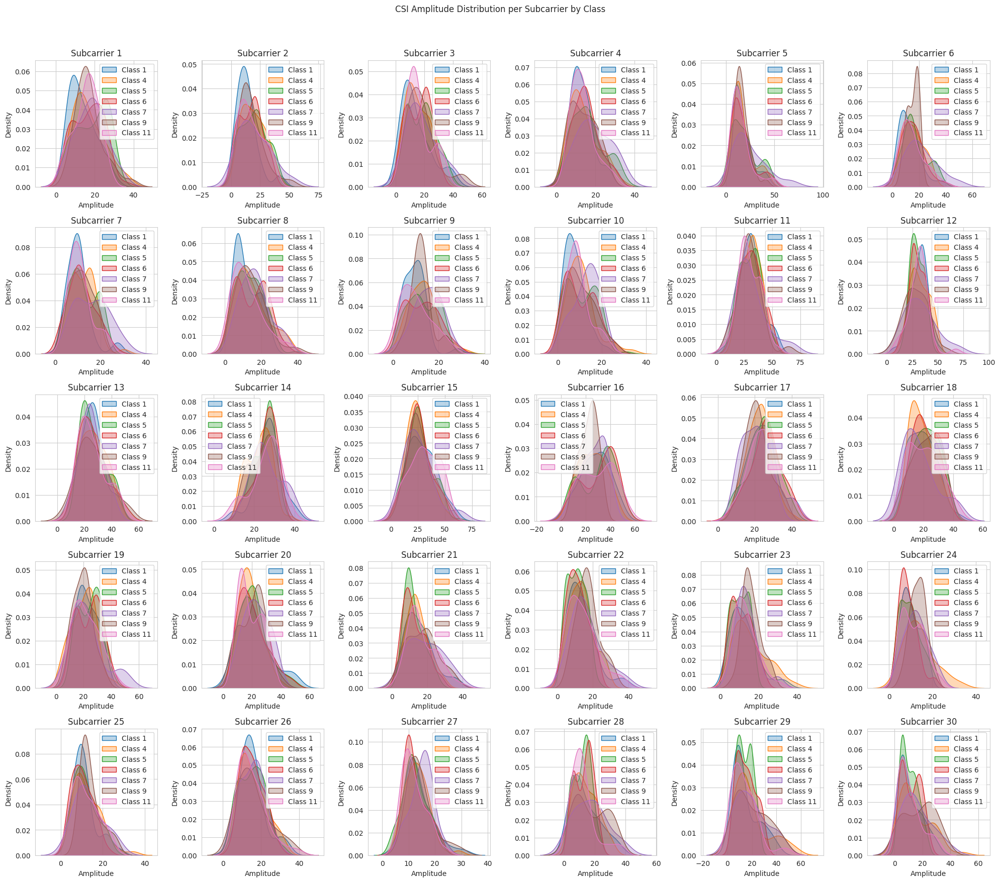

-------------------------------------------------------------------------------- Client 2 --------------------------------------------------------------------------------


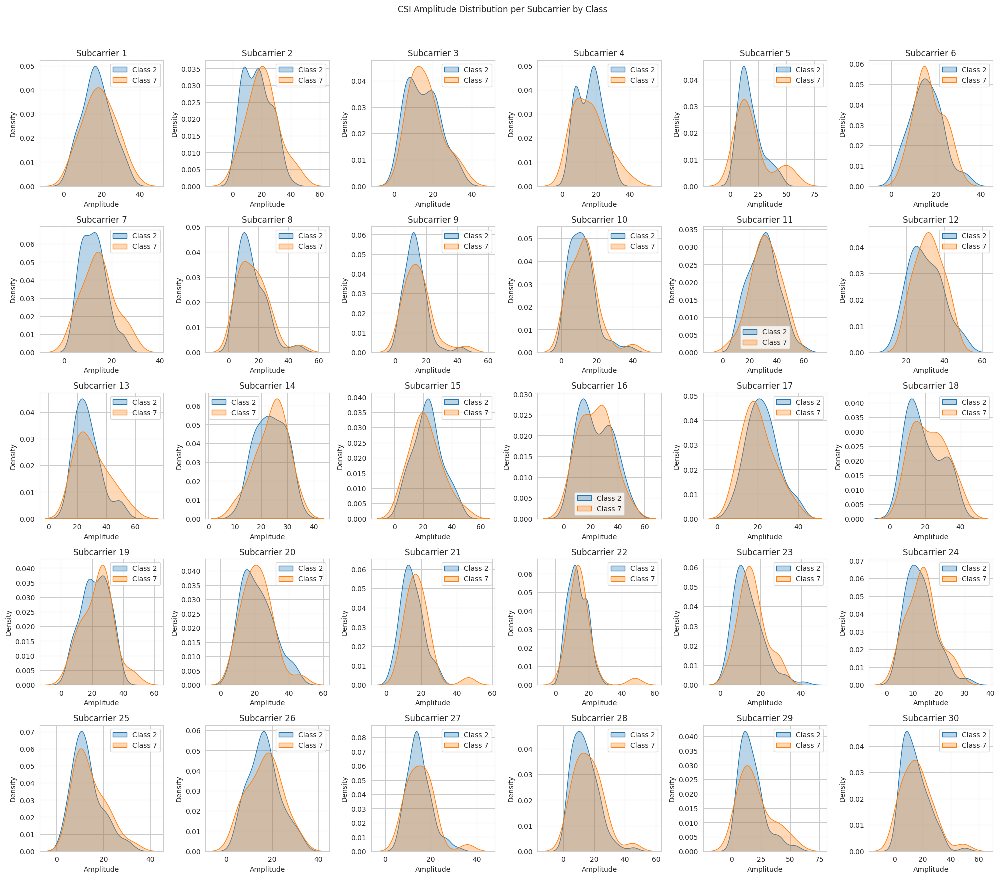

-------------------------------------------------------------------------------- Client 3 --------------------------------------------------------------------------------


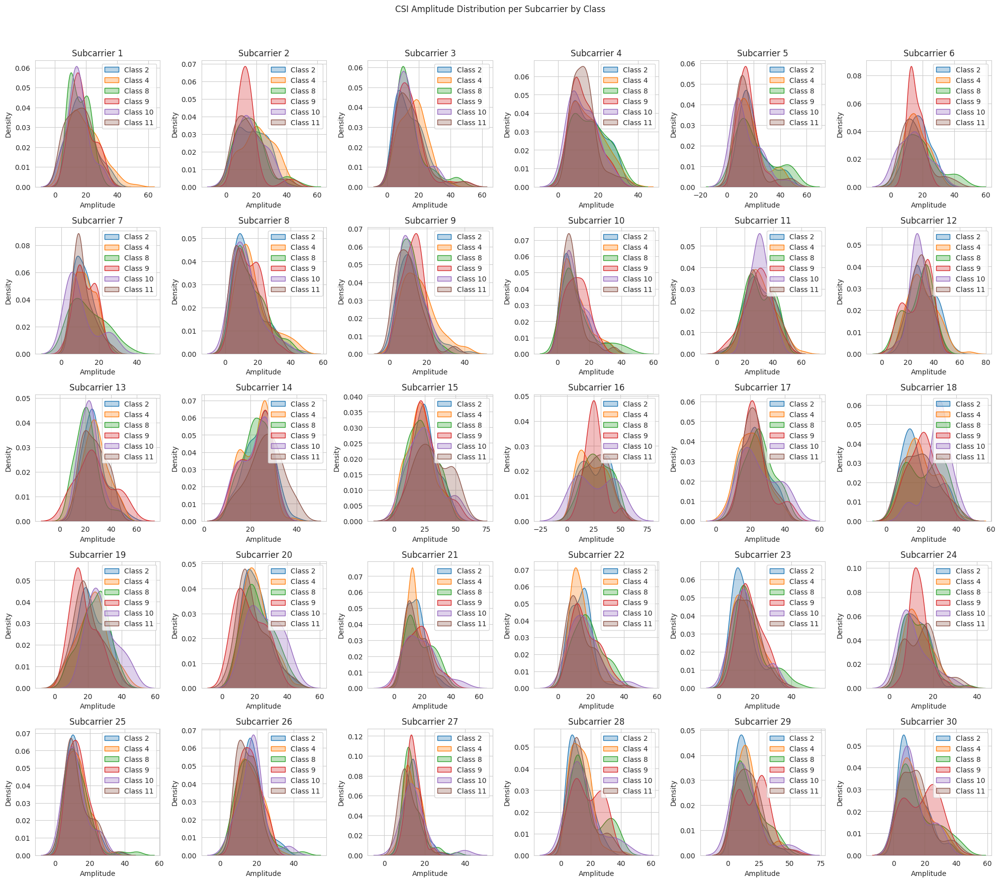

-------------------------------------------------------------------------------- Client 4 --------------------------------------------------------------------------------


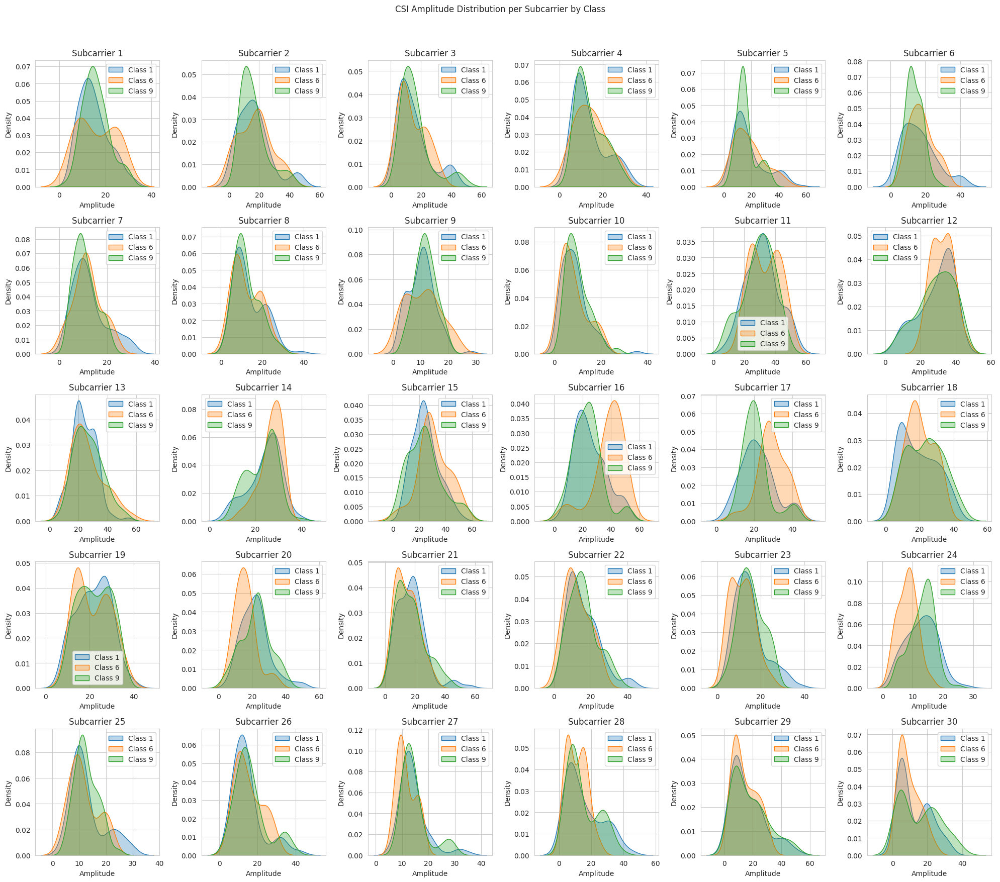

-------------------------------------------------------------------------------- Client 5 --------------------------------------------------------------------------------


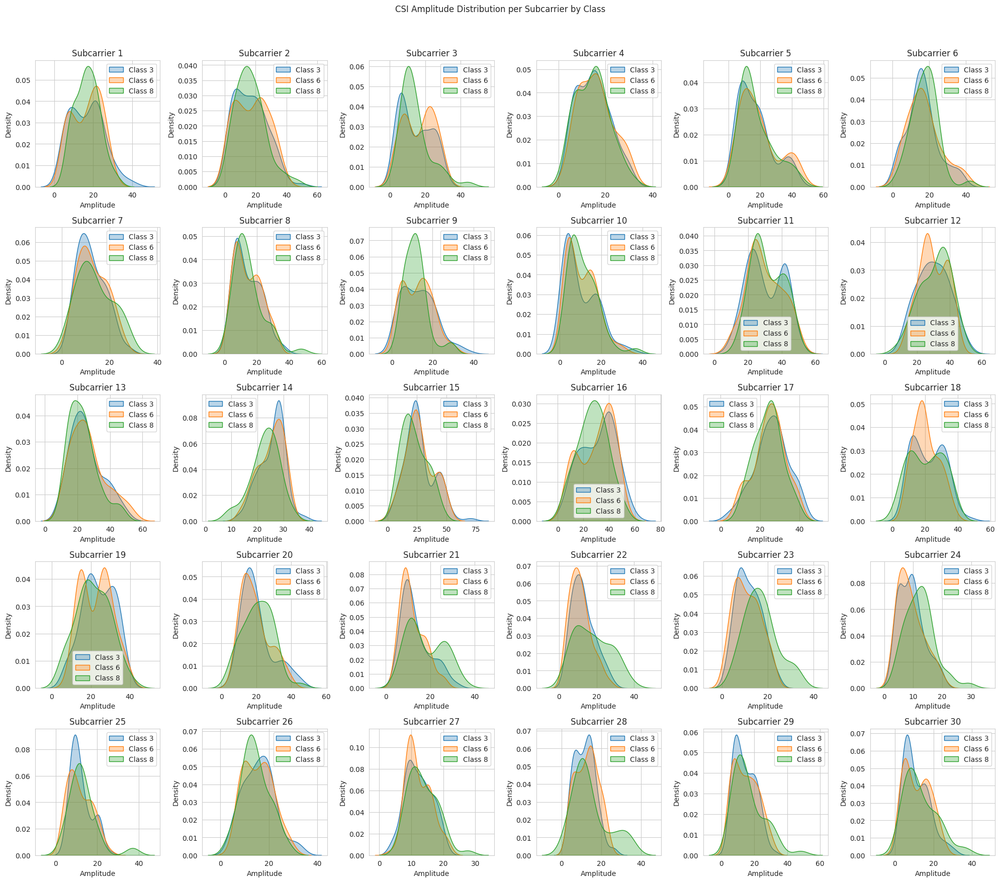

-------------------------------------------------------------------------------- Client 6 --------------------------------------------------------------------------------


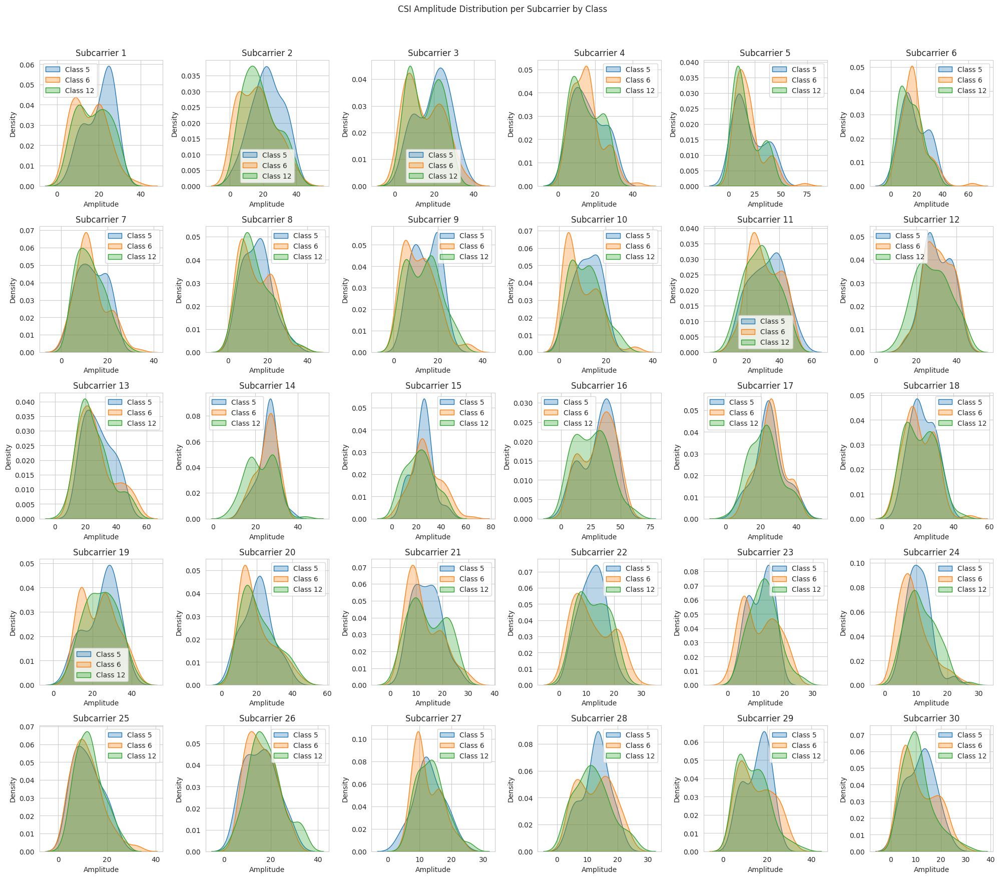

-------------------------------------------------------------------------------- Client 7 --------------------------------------------------------------------------------


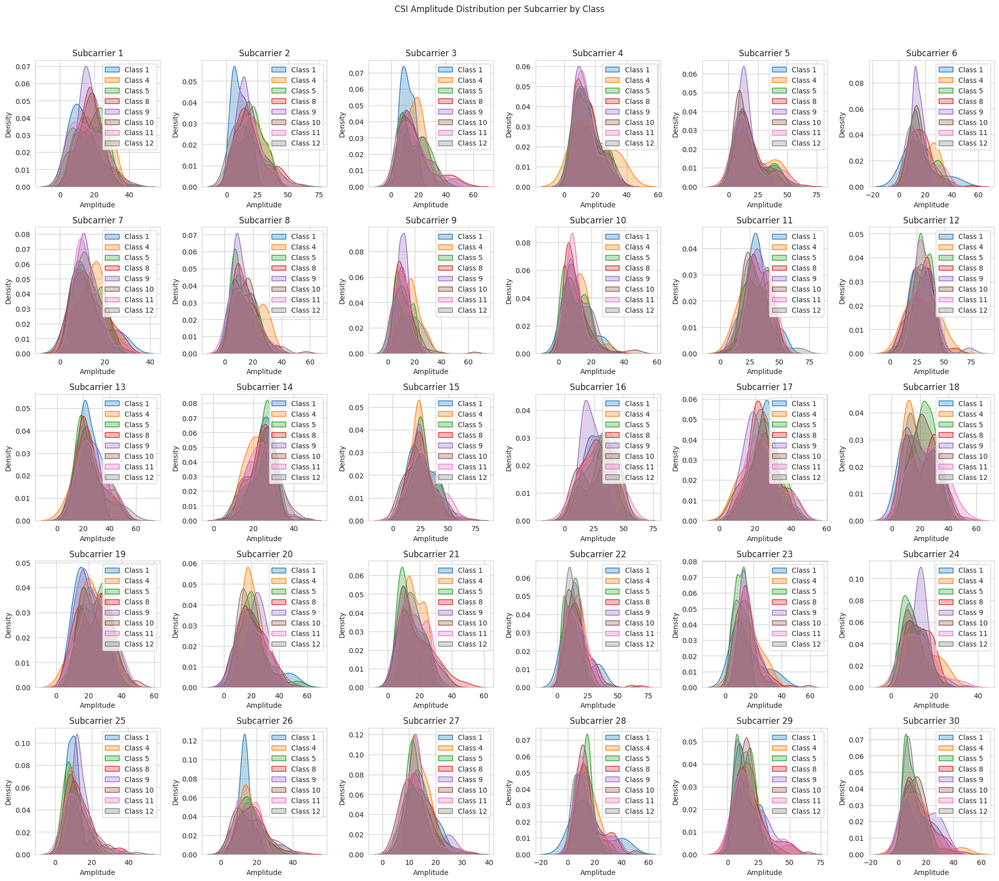

-------------------------------------------------------------------------------- Client 8 --------------------------------------------------------------------------------


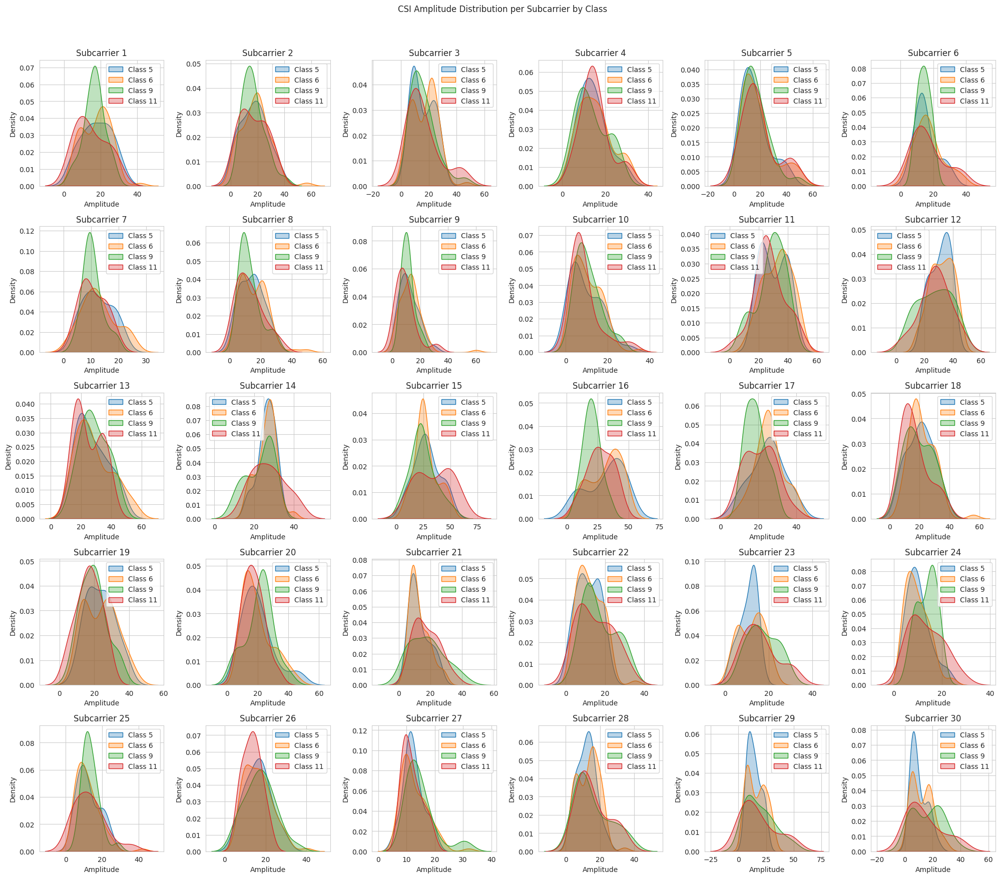

-------------------------------------------------------------------------------- Client 9 --------------------------------------------------------------------------------


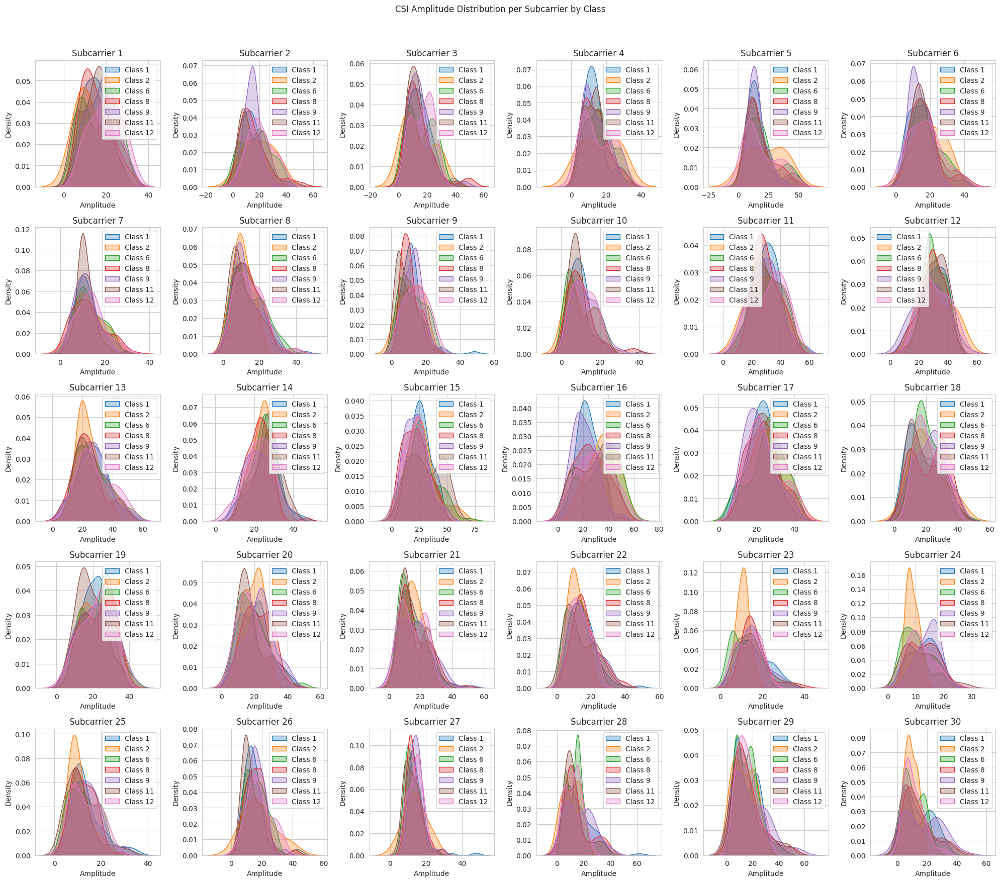

-------------------------------------------------------------------------------- Client 10 --------------------------------------------------------------------------------


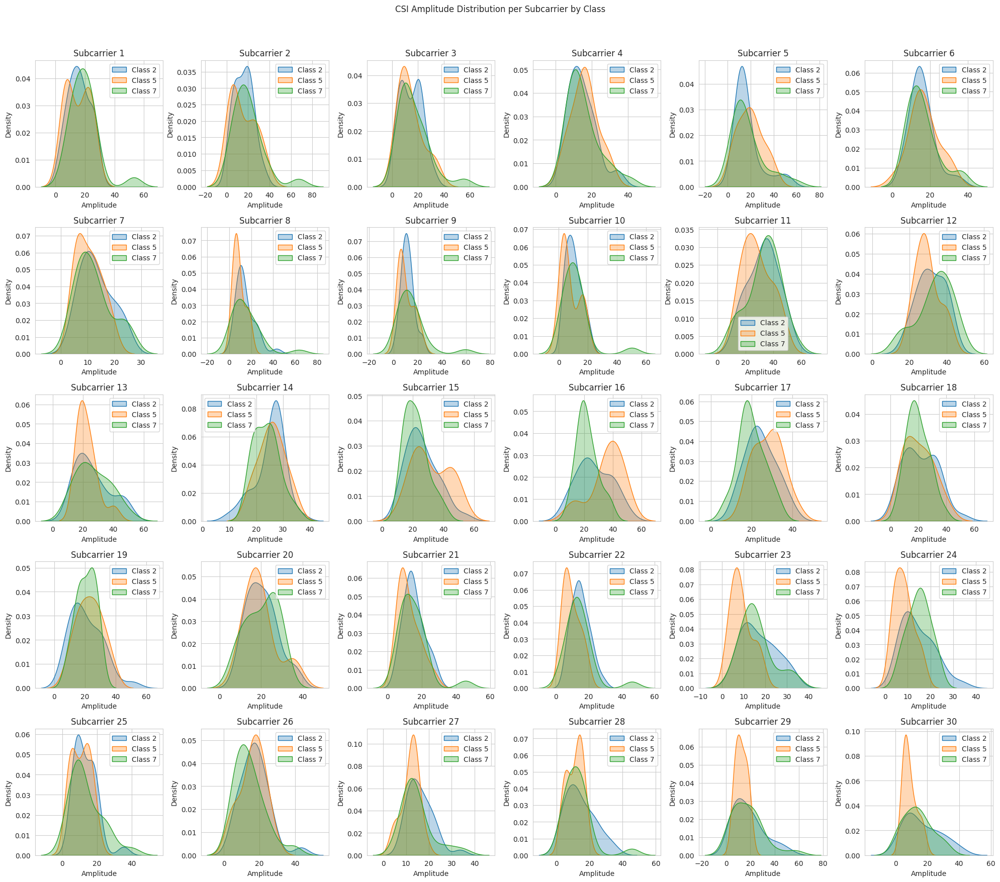

In [5]:
# Visualizing amplitudes per class per subcarrier of client datasets
for client in range(num_clients):
  print(f"-------------------------------------------------------------------------------- Client {client+1} --------------------------------------------------------------------------------")
  csi_data = client_dfs_features_amp[client]
  amplitudes = np.abs(csi_data)
  avg_amplitudes = np.mean(amplitudes, axis=(2, 3))  # Average over Tx and Rx

  # Get class information
  classes = np.unique(client_dfs_labels[client])
  num_plots_row = int(np.ceil(np.sqrt(30)))

  # Set up plot
  plt.figure(figsize=(20, 20))
  sns.set_style("whitegrid")
  plt.suptitle('CSI Amplitude Distribution per Subcarrier by Class', y=1.02)

  # Plot each subcarrier
  for subcarrier in range(30):
      plt.subplot(num_plots_row, num_plots_row, subcarrier+1)

      for class_label in classes:
          class_mask = (client_dfs_labels[client].flatten() == class_label)
          sns.kdeplot(avg_amplitudes[class_mask, subcarrier],
                      label=f'Class {class_label}',
                      fill=True,
                      alpha=0.3)

      plt.title(f'Subcarrier {subcarrier+1}')
      plt.xlabel('Amplitude')
      plt.ylabel('Density')
      plt.legend()

  plt.tight_layout()
  plt.show()


These plots give us valuable insights into how the data is organized. As seen from the legend of each graph, the number of classes present varies from client to client. We can use this information to decide which clients to prioritize for federated learning.

In [6]:
density_weight = 0.4
diversity_weight = 0.6

client_scores = np.zeros(num_clients)
class_counts = np.zeros((num_clients, num_classes))

# Counts the unique classes each client's dataset has
for client_idx in range(num_clients):
  for class_id in np.unique(client_dfs_labels[client_idx]):
      class_counts[client_idx, class_id - 1] += 1

# Number of times each class is present in a dataset
class_totals = np.sum(class_counts, axis=0)

# The clients with the most classes will have a lower density coefficient
density_coefficients = 1 / np.sum(class_counts, axis = 1)

# The percentage of classes that a dataset contains over the sum of all classes present. The sum equals 1.
class_ratios = class_totals / sum(class_totals)

# Coefficients of diversity for each class. If a class appears frequently on the dataset, it will have a lower coefficient
diversity_coefficients = 10 * np.clip((1/num_classes) - class_ratios, a_min=0, a_max= None)

for client_idx in range(num_clients):
  # the client diversity coefficient is the sum of all diversity coefficients for the classes present in the client's dataset
  client_diversity_coefficient = sum(np.multiply(class_counts[client_idx, :], diversity_coefficients))
  print(f"Density coefficient for client {client_idx+1}: {density_coefficients[client_idx]}")
  print(f"Diversity coefficient for client {client_idx+1}: {client_diversity_coefficient}\n")
  # The clients scores are calculated adding the density coefficinets and the client diversity coefficient
  # Both terms are multiplied by their respective weight.
  client_scores[client_idx] = density_weight * density_coefficients[client_idx] + diversity_weight * client_diversity_coefficient

print(f"Class representation per client:\n {class_counts}")
print(f"Class totals: {class_totals}")
print(f"Class ratios: {class_ratios}")
print(f"Final client scores: {client_scores}")


Density coefficient for client 1: 0.14285714285714285
Diversity coefficient for client 1: 0.3623188405797101

Density coefficient for client 2: 0.5
Diversity coefficient for client 2: 0.18115942028985504

Density coefficient for client 3: 0.16666666666666666
Diversity coefficient for client 3: 0.5797101449275361

Density coefficient for client 4: 0.3333333333333333
Diversity coefficient for client 4: 0.0

Density coefficient for client 5: 0.3333333333333333
Diversity coefficient for client 5: 0.6159420289855072

Density coefficient for client 6: 0.3333333333333333
Diversity coefficient for client 6: 0.18115942028985504

Density coefficient for client 7: 0.125
Diversity coefficient for client 7: 0.7608695652173911

Density coefficient for client 8: 0.25
Diversity coefficient for client 8: 0.0

Density coefficient for client 9: 0.14285714285714285
Diversity coefficient for client 9: 0.18115942028985504

Density coefficient for client 10: 0.3333333333333333
Diversity coefficient for clien

We now have a model to decide how involved each client will be in the model.

## **Part II: Preparation of the FL setting**

In [19]:
# Seed for randomization
random.seed(25)

To prepare for the federated learning, we first have to create a global model, which will act as the orchestrator for the different clients. We create the model using swish as our activation function, as it is better suited for classification tasks and can be used with negative values we have from scaling using Power Transform (yeo-johnson). For our loss function, we compute the Sparse Categorical Cross Entropy, which validates the correctness of the predictions by checking the value given by the model prediction to the correct class. We use an input layer of 270 neurons, an output layer of 12, and 4 hidden layers between them of 540, 270, 135, and 68 neurons in that order.

In [20]:
# Define model architecture
def create_model(input_dim, num_classes):
    # Use Input layer to define the input shape
    model = Sequential([
        Input(shape=(input_dim,)), # Define input shape explicitly
        Dense(540, activation='swish'), # Densely connected NN layer (just like Lineal in PyTorch)
        Dropout(0.3), # Chance to set an input unit to 0
        Dense(270, activation='swish'),
        Dropout(0.3),
        Dense(135, activation='swish'),
        Dropout(0.3),
        Dense(68, activation='swish'),
        Dropout(0.3),
        Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss=SparseCategoricalCrossentropy(),
        metrics=['accuracy']
    )

    return model

Now we can begin training the model using the client datasets. We use the distribution previously computed for every client to decide if they enter the training round or not. Then, we train the model using the datasets that entered the training round. If no client has been chosen, we select the one with the highest chance as the only dataset for the current training round.

After finishing each round, we update the global model using the mean weights of all local models.

In [21]:
# Configuration
global_num_classes = 12
num_rounds = 10
local_epochs = 15
batch_size = 32

# Initialize global model
input_dim = client_dfs_features[0].shape[1]
global_model = create_model(input_dim=input_dim, num_classes=global_num_classes)

for rnd in range(num_rounds):
    print(f"\nFederated Round {rnd+1}")

    # Probabilistic client selection
    selected_clients = []

    for client_idx in range(num_clients):
        if random.uniform(0, 1) < client_scores[client_idx]:
            selected_clients.append(client_idx)

    if len(selected_clients) == 0:
        print("No clients selected; using best scoring client.")
        selected_clients.append(int(np.argmax(client_scores)))

    print(f"Selected Clients: {[i+1 for i in selected_clients]}")

    client_models = []

    for i in selected_clients:
        print(f" Client {i+1} training...")

        X_train = client_dfs_features[i]
        y_train = client_dfs_labels[i].flatten() - 1

        # Instantiate local_model and load the weights from the global model
        local_model = create_model(input_dim=input_dim, num_classes=global_num_classes)
        local_model.set_weights(global_model.get_weights())

        local_model.fit(X_train, y_train, epochs=local_epochs, batch_size=batch_size, verbose=0)
        client_models.append(local_model)

    # --- FedAvg aggregation ---
    avg_weights = [
        np.mean([model.get_weights()[layer] for model in client_models], axis=0)
        for layer in range(len(global_model.get_weights()))
    ]
    #print("New weights", avg_weights)
    global_model.set_weights(avg_weights)

    print("Global model updated.")



Federated Round 1
Selected Clients: [5, 7]
 Client 5 training...
 Client 7 training...
Global model updated.

Federated Round 2
Selected Clients: [1, 3, 5, 7, 10]
 Client 1 training...
 Client 3 training...
 Client 5 training...
 Client 7 training...
 Client 10 training...
Global model updated.

Federated Round 3
Selected Clients: [1, 5, 6]
 Client 1 training...
 Client 5 training...
 Client 6 training...
Global model updated.

Federated Round 4
Selected Clients: [5, 7]
 Client 5 training...
 Client 7 training...
Global model updated.

Federated Round 5
Selected Clients: [2, 3, 5]
 Client 2 training...
 Client 3 training...
 Client 5 training...
Global model updated.

Federated Round 6
Selected Clients: [2, 3, 6, 7, 9]
 Client 2 training...
 Client 3 training...
 Client 6 training...
 Client 7 training...
 Client 9 training...
Global model updated.

Federated Round 7
Selected Clients: [2, 5, 8]
 Client 2 training...
 Client 5 training...
 Client 8 training...
Global model updated.

Fe

## **Part III: Collaborative training of the model**

Finally, we load the test datasets and perform the final evaluations.

In [22]:
# Load features and labels
test_features_path = dataset_path + 'test_features.csv'
test_labels_path = dataset_path + 'test_labels.csv'
X_test = pd.read_csv(test_features_path, header=None).values.astype(float)
y_test = pd.read_csv(test_labels_path, header=None).values.astype(int).flatten()

# Use the same scaler used for training
X_test_scaled = scaler.transform(X_test)

# Subtract 1 because labels are 1–12 and model expects 0–11
y_test = y_test - 1

# Evaluate performance on test data
loss, accuracy = global_model.evaluate(X_test_scaled, y_test, verbose=1)

print(f"\n📊 Test Accuracy: {accuracy:.4f}")
print(f"🧾 Test Loss: {loss:.4f}")

predictions = np.argmax(global_model.predict(X_test_scaled), axis=1)

print("\n🔍 First 10 Predictions vs Actual:")
for i in range(10):
    print(f"Sample {i+1}: Predicted = {predictions[i]+1}, Actual = {y_test[i]+1}")



16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4729 - loss: 1.9741

📊 Test Accuracy: 0.4540
🧾 Test Loss: 2.1220
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

🔍 First 10 Predictions vs Actual:
Sample 1: Predicted = 2, Actual = 8
Sample 2: Predicted = 10, Actual = 4
Sample 3: Predicted = 6, Actual = 5
Sample 4: Predicted = 9, Actual = 4
Sample 5: Predicted = 6, Actual = 6
Sample 6: Predicted = 11, Actual = 7
Sample 7: Predicted = 4, Actual = 4
Sample 8: Predicted = 10, Actual = 11
Sample 9: Predicted = 12, Actual = 2
Sample 10: Predicted = 11, Actual = 11


Our neural network performs rather poorly, with most runs having around 45% accuracy and some getting a really low accuracy. This may be attributed to the way we have chosen to coordinate the different models, the quality of the dataset, or the hyperparameters of the neural network.